<a href="https://colab.research.google.com/github/health4924/Military-Soldier-Safety-and-Weapon-Detection-using-YOLO-and-Computer-Vision/blob/main/Final_Military_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# file extraction and saving in dive
import zipfile
import os

zip_path = "/content/drive/MyDrive/Final_Military_project/Military.zip"
extract_path = "/content/drive/MyDrive/Final_Military_project"
# create folder if not exists
os.makedirs(extract_path, exist_ok=True)

# unzip
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Extraction completed!")


Extraction completed!


In [ ]:
test_data="/content/drive/MyDrive/Final_Military_project/military_object_dataset/test"
train_data="/content/drive/MyDrive/Final_Military_project/military_object_dataset/train"
val_data="/content/drive/MyDrive/Final_Military_project/military_object_dataset/val"

In [ ]:
test_data_lable="/content/drive/MyDrive/Final_Military_project/military_object_dataset/test/labels"
train_data_lable="/content/drive/MyDrive/Final_Military_project/military_object_dataset/train/labels"
val_data_lable="/content/drive/MyDrive/Final_Military_project/military_object_dataset/val/labels"

In [ ]:
# importing required liberies
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
!pip install torch torchvision opencv-python matplotlib seaborn streamlit gdown



!pip install ultralytics
!pip install gdown
!pip install scikit-learn
!pip install py-yaml tqdm

!pip install torch torchvision torchaudio
!pip install ultralytics opencv-python matplotlib seaborn streamlit gdown scikit-learn py-yaml tqdm
!pip install albumentations



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 18.9 MB/s eta 0:00:00
ERROR: Could not find a version that satisfies the requirement py-yaml (from versions: none)
ERROR: No matching distribution found for py-yaml
ERROR: Could not find a version that satisfies the requirement py-yaml (from versions: none)
ERROR: No matching distribution found for py-yaml


## Exploratory Data Analysis (EDA)

In [ ]:
# changeing the directory
import os
os.chdir("/content/drive/MyDrive/Final_Military_project/military_object_dataset")

In [ ]:
# visuvalising the images in train datasedt
img=Image.open("test/images/000001.jpg")
img2=Image.open("test/images/000002.jpg")

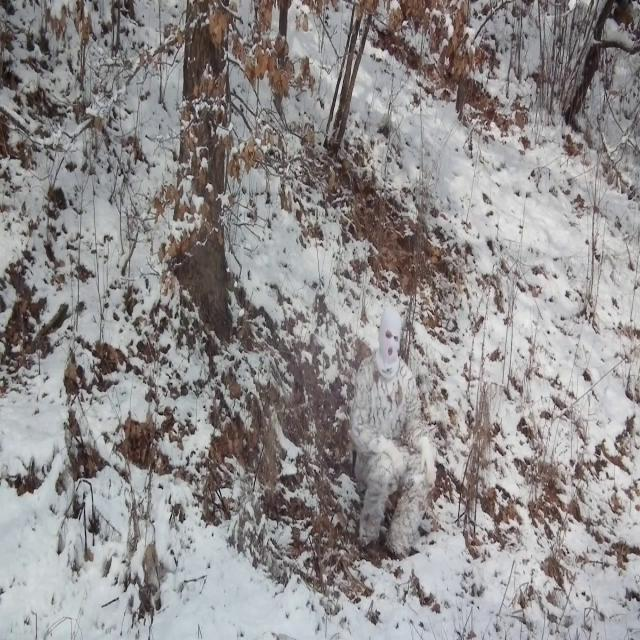

In [ ]:
# Visuvalise and seeing how the image is

img

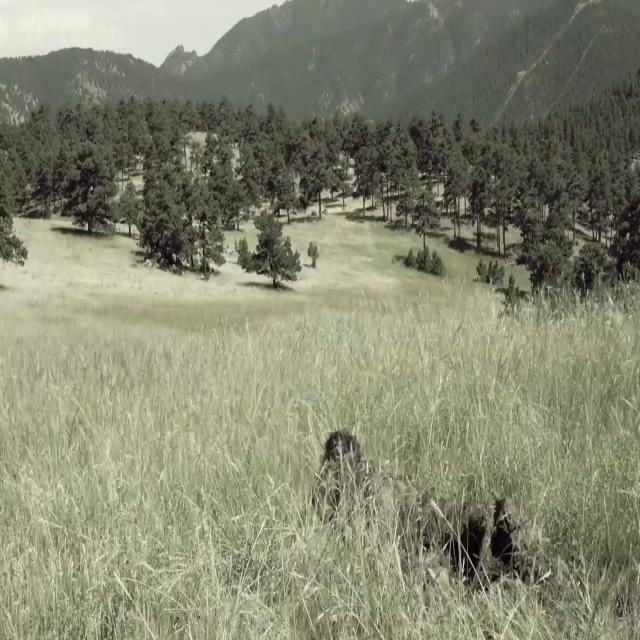

In [ ]:
img2

array([[[236, 237, 229],
        [236, 237, 229],
        [236, 237, 229],
        ...,
        [ 92,  98,  88],
        [ 92,  98,  88],
        [ 92,  98,  88]],

       [[236, 237, 229],
        [236, 237, 229],
        [236, 237, 229],
        ...,
        [ 92,  98,  88],
        [ 92,  98,  88],
        [ 92,  98,  88]],

       [[234, 235, 227],
        [234, 235, 227],
        [234, 235, 227],
        ...,
        [ 92,  98,  88],
        [ 92,  98,  88],
        [ 92,  98,  88]],

       ...,

       [[126, 127,  96],
        [131, 132, 101],
        [139, 140, 109],
        ...,
        [120, 118,  97],
        [161, 159, 138],
        [107, 105,  84]],

       [[123, 124,  93],
        [129, 130,  99],
        [138, 139, 108],
        ...,
        [124, 122, 101],
        [151, 149, 128],
        [104, 102,  81]],

       [[126, 127,  96],
        [130, 131, 100],
        [135, 136, 105],
        ...,
        [134, 132, 111],
        [142, 140, 119],
        [108, 106,  85]]], dtype=uint8)
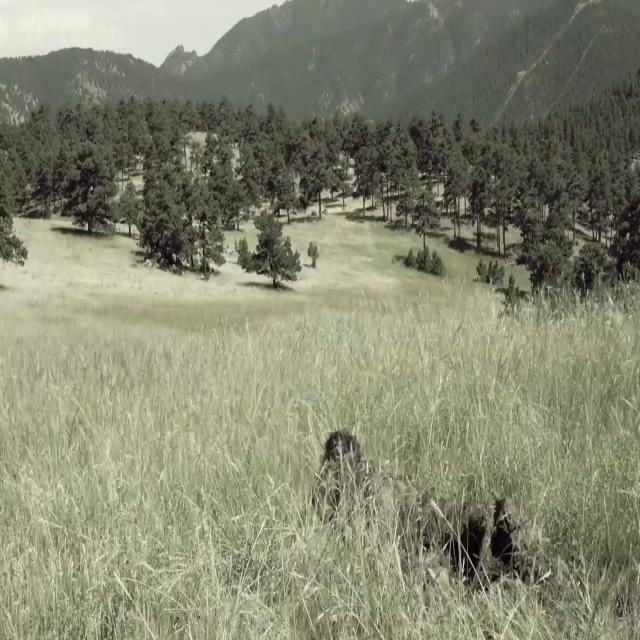

In [ ]:
np.array(img2)

array([[[ 53,  45,  43],
        [ 46,  38,  36],
        [ 35,  27,  25],
        ...,
        [ 99,  94, 101],
        [ 43,  37,  47],
        [132, 126, 136]],

       [[ 52,  44,  42],
        [ 43,  35,  33],
        [ 27,  19,  17],
        ...,
        [ 88,  83,  90],
        [ 39,  33,  43],
        [124, 118, 128]],

       [[ 63,  55,  53],
        [ 55,  47,  45],
        [ 36,  31,  28],
        ...,
        [ 96,  91,  98],
        [ 40,  35,  42],
        [ 57,  52,  59]],

       ...,

       [[175, 182, 190],
        [175, 182, 190],
        [178, 185, 193],
        ...,
        [160, 164, 173],
        [159, 163, 172],
        [155, 159, 168]],

       [[172, 179, 187],
        [172, 179, 187],
        [174, 181, 189],
        ...,
        [163, 167, 176],
        [161, 165, 174],
        [156, 160, 169]],

       [[168, 175, 183],
        [167, 174, 182],
        [168, 175, 183],
        ...,
        [166, 170, 179],
        [168, 172, 181],
        [166, 170, 179]]], dtype=uint8)
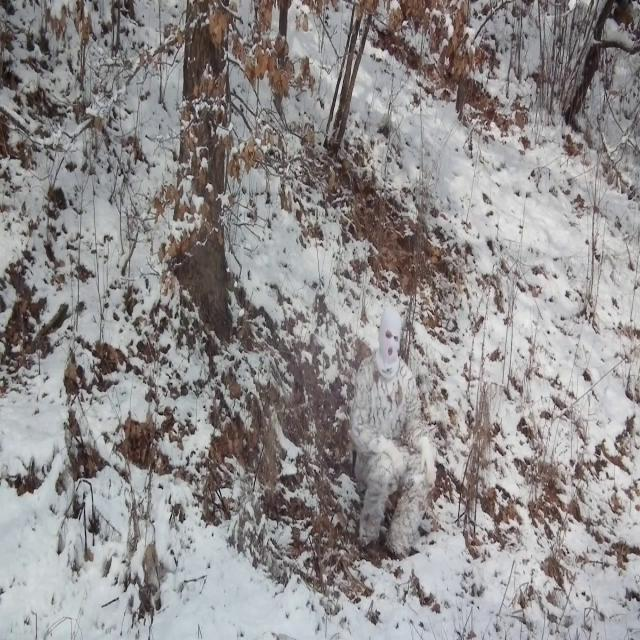

In [ ]:
np.array(img)

In [ ]:

!pip install ultralytics --upgrade
from ultralytics import YOLO


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
import os

# Base dataset path
base_path = "/content/drive/MyDrive/Final_Military_project/military_object_dataset"

# Folders to check
splits = ["train", "val", "test"]

# Extensions
image_extensions = (".jpg", ".jpeg", ".png")
label_extension = ".txt"

for split in splits:
    img_folder = os.path.join(base_path, split, "images")
    lbl_folder = os.path.join(base_path, split, "labels")

    # Count images
    images = [f for f in os.listdir(img_folder) if f.lower().endswith(image_extensions)]
    # Count labels
    labels = [f for f in os.listdir(lbl_folder) if f.lower().endswith(label_extension)]

    print(f"\n{split.upper()} SET")
    print(f"Images: {len(images)}")
    print(f"Labels: {len(labels)}")

    # Check mismatches
    img_names = {os.path.splitext(f)[0] for f in images}
    lbl_names = {os.path.splitext(f)[0] for f in labels}

    missing_labels = img_names - lbl_names
    missing_images = lbl_names - img_names

    if missing_labels:
        print(f"Missing labels for {len(missing_labels)} images")
    if missing_images:
        print(f"Missing images for {len(missing_images)} labels")
    if not missing_labels and not missing_images:
        print("All images have matching labels")



TRAIN SET
Images: 21978
Labels: 21978
All images have matching labels

VAL SET
Images: 2941
Labels: 2941
All images have matching labels

TEST SET
Images: 1396
Labels: 1396
All images have matching labels


In [ ]:
yaml_text = """
path: /content/drive/MyDrive/Final_Military_project/military_object_dataset
train: /content/drive/MyDrive/Final_Military_project/military_object_dataset/train
val: /content/drive/MyDrive/Final_Military_project/military_object_dataset/val
test: /content/drive/MyDrive/Final_Military_project/military_object_dataset/test

nc: 12
names:
  0: camouflage_soldier
  1: weapon
  2: military_tank
  3: military_truck
  4: military_vehicle
  5: civilian
  6: soldier
  7: civilian_vehicle
  8: military_artillery
  9: trench
  10: military_aircraft
  11: military_warship
"""

with open("military_dataset.yaml", "w") as f:
    f.write(yaml_text)


In [ ]:
import os
import shutil

original_dataset = "/content/drive/MyDrive/Final_Military_project/military_object_dataset"
output_dataset = "/content/drive/MyDrive/small_dataset"

# Original to new class ID mapping
class_map = {1: 0, 3: 1, 4: 2, 8: 3, 11: 4}

def process_split(split):
    img_in = f"{original_dataset}/{split}/images"
    lbl_in = f"{original_dataset}/{split}/labels"
    img_out = f"{output_dataset}/{split}/images"
    lbl_out = f"{output_dataset}/{split}/labels"

    os.makedirs(img_out, exist_ok=True)
    os.makedirs(lbl_out, exist_ok=True)

    for file in os.listdir(lbl_in):
        label_path = os.path.join(lbl_in, file)
        new_lines = []

        with open(label_path, "r") as f:
            for line in f:
                parts = line.strip().split()
                cls = int(parts[0])
                if cls in class_map:
                    new_lines.append(f"{class_map[cls]} {' '.join(parts[1:])}\n")

        if new_lines:
            # Write new label file
            with open(os.path.join(lbl_out, file), "w") as f:
                f.writelines(new_lines)

            # Copy corresponding image
            img_file = file.replace(".txt", ".jpg")
            src_img = os.path.join(img_in, img_file)
            dst_img = os.path.join(img_out, img_file)
            if os.path.exists(src_img):
                shutil.copy(src_img, dst_img)

# Run on all splits
for split in ['train', 'val', 'test']:
    process_split(split)

In [ ]:
yaml_text = """
path: /content/drive/MyDrive/small_dataset
train: /content/drive/MyDrive/small_dataset/train
val: /content/drive/MyDrive/small_dataset/val
test: /content/drive/MyDrive/small_dataset/test

names:
  0: weapon
  1: military_truck
  2: military_vehicle
  3: military_artillery
  4: military_warship
"""
with open("/content/drive/MyDrive/small_dataset/military_original_dataset.yaml", "w") as f:
    f.write(yaml_text)




In [ ]:
from collections import Counter
import os

# Path to your original dataset labels
labels_path = "/content/drive/MyDrive/Final_Military_project/military_object_dataset/train/labels"

# Initialize a counter for class frequencies
class_counts = Counter()

# List of class names (0-11)
class_names = [
    "camouflage_soldier", "weapon", "military_tank", "military_truck",
    "military_vehicle", "civilian", "soldier", "civilian_vehicle",
    "military_artillery", "trench", "military_aircraft", "military_warship"
]

# Loop through only .txt files
for label_file in os.listdir(labels_path):
    if label_file.endswith(".txt"):
        file_path = os.path.join(labels_path, label_file)
        if os.path.isfile(file_path):
            with open(file_path, 'r') as f:
                for line in f:
                    class_id = int(line.split()[0])
                    class_counts[class_id] += 1

# Print class distribution
print("Class Distribution in Original Dataset (Train Split):")
for cid, count in sorted(class_counts.items()):
    print(f"{class_names[cid]}: {count}")


Class Distribution in Original Dataset (Train Split):
camouflage_soldier: 4477
weapon: 1210
military_tank: 17454
military_truck: 1245
military_vehicle: 1963
civilian: 52
soldier: 6502
civilian_vehicle: 519
military_artillery: 439
trench: 4
military_aircraft: 7337
military_warship: 2134


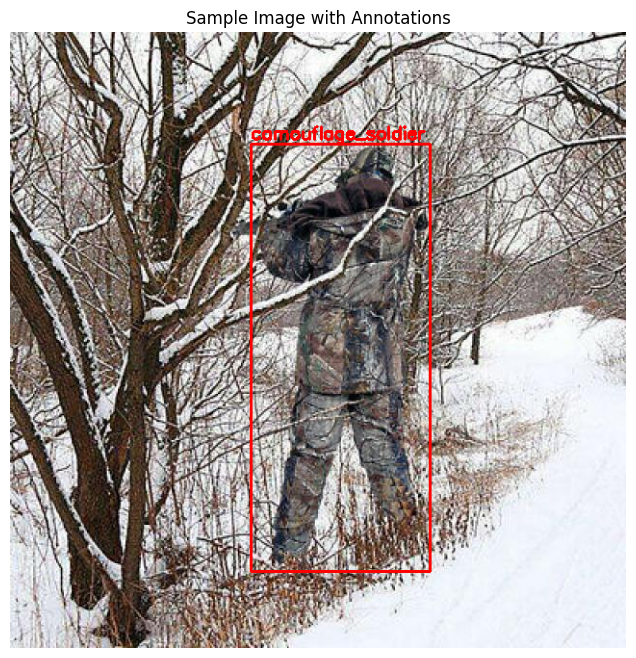

In [ ]:
# Visualize Sample bounding boxes

import cv2
import matplotlib.pyplot as plt

img_dir = "/content/drive/MyDrive/Final_Military_project/military_object_dataset/train/images"
label_dir = "/content/drive/MyDrive/Final_Military_project/military_object_dataset/train/labels"

# Pick a sample image
img_file = os.listdir(img_dir)[0]
img_path = os.path.join(img_dir, img_file)
label_path = os.path.join(label_dir, img_file.replace(".jpg", ".txt"))

# Load image
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
h, w, _ = img.shape

# Draw bounding boxes
with open(label_path, "r") as f:
    for line in f:
        cls, x, y, bw, bh = map(float, line.strip().split())
        x1 = int((x - bw/2) * w)
        y1 = int((y - bh/2) * h)
        x2 = int((x + bw/2) * w)
        y2 = int((y + bh/2) * h)
        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
        cv2.putText(img, class_names[int(cls)], (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,0,0), 2)

plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.axis('off')
plt.title("Sample Image with Annotations")
plt.show()

**YOLO Training Model Name:"yolov8n.pt"**

In [ ]:
from ultralytics import YOLO

# Load pre-trained YOLOv8n model
model = YOLO("yolov8n.pt")

# Train the model
model.train(
    data="military_dataset.yaml",    # Path to dataset config
    epochs=50,                       # Number of epochs
    imgsz=640,                       # Input image size
    batch=8,                         # Batch size
    name="military_safety_yolov86",  # Experiment name
    patience=10,                     # Early stopping after 10 epochs with no improvement
    save_period=5                    # Save weights every 5 epochs
)


Ultralytics 8.3.205 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=military_dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=military_safety_yolov863, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=10, perspective=0.0, plots=Tr

*Training the selected classes*

In [ ]:
# Visualize evaluation results
from ultralytics import YOLO

model = YOLO("yolov8n.pt")
model.train(
    data="/content/drive/MyDrive/small_dataset/military_original_dataset.yaml",
    epochs=45,
    imgsz=640,
    batch=8,
    name="military_safety_yolov8",
    patience=5,        # stops early if no improvement
    save_period=5      # saves weights every 5 epochs
)


Ultralytics 8.3.217 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/small_dataset/military_original_dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=45, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=military_safety_yolov8, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b5090107da0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

In [ ]:
!cp -r /content/runs/detect/military_safety_yolov8 /content/drive/MyDrive/Final_Military_project/


# **Model Evaluation**

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/Final_Military_project/military_safety_yolov8/weights/best.pt")


In [ ]:
# Evaluate on validation dataset
metrics = model.val(
    data="/content/drive/MyDrive/small_dataset/military_original_dataset.yaml"
)

# Print key metrics
print("Precision:", metrics.box.p)
print("Recall:", metrics.box.r)
print("mAP@0.5:", metrics.box.map50)
print("mAP@0.5:0.95:", metrics.box.map)

Ultralytics 8.3.217 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.5±0.2 ms, read: 120.5±155.8 MB/s, size: 845.7 KB)
val: Scanning /content/drive/MyDrive/small_dataset/val/labels.cache... 533 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 533/533 759.4Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 34/34 3.0it/s 11.3s
                   all        533        930      0.775      0.624      0.713      0.485
                weapon        222        358      0.849      0.617      0.702      0.494
        military_truck         84        148      0.777      0.595      0.736      0.455
      military_vehicle        149        307      0.798      0.658      0.733      0.539
    military_artillery         85        117      0.675      0.624      0.679      0.454
Speed: 1.3ms preprocess, 4.6m

Model Evaluation

In [ ]:
# Saved Location
# /content/runs/detect/military_safety_yolov8/



# **# Visualize evaluation results**

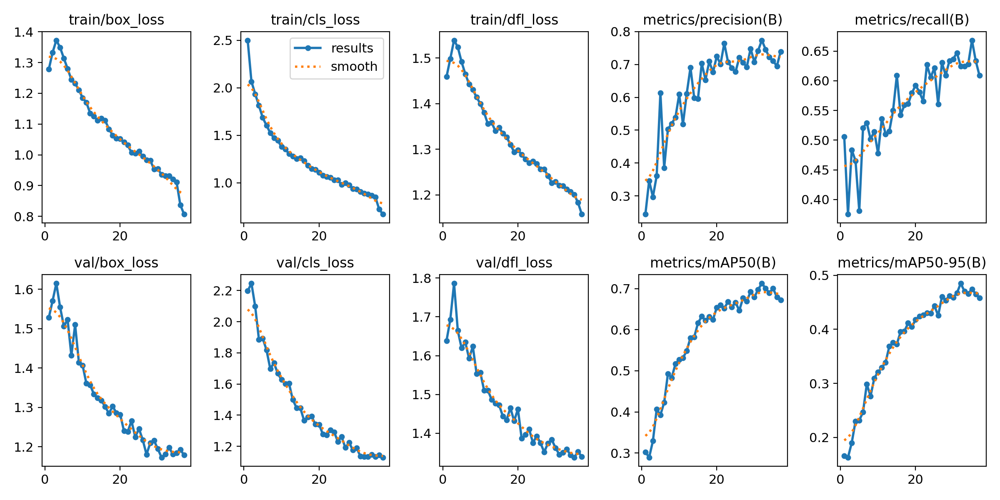

In [ ]:
from IPython.display import Image, display
import os

# Path to the results image generated by YOLO
results_path = "/content/drive/MyDrive/Final_Military_project/military_safety_yolov8/results.png"

# Check if the file exists
if os.path.exists(results_path):
    display(Image(filename=results_path))
else:
    print("Results image not found. Make sure 'results.png' exists in the folder.")

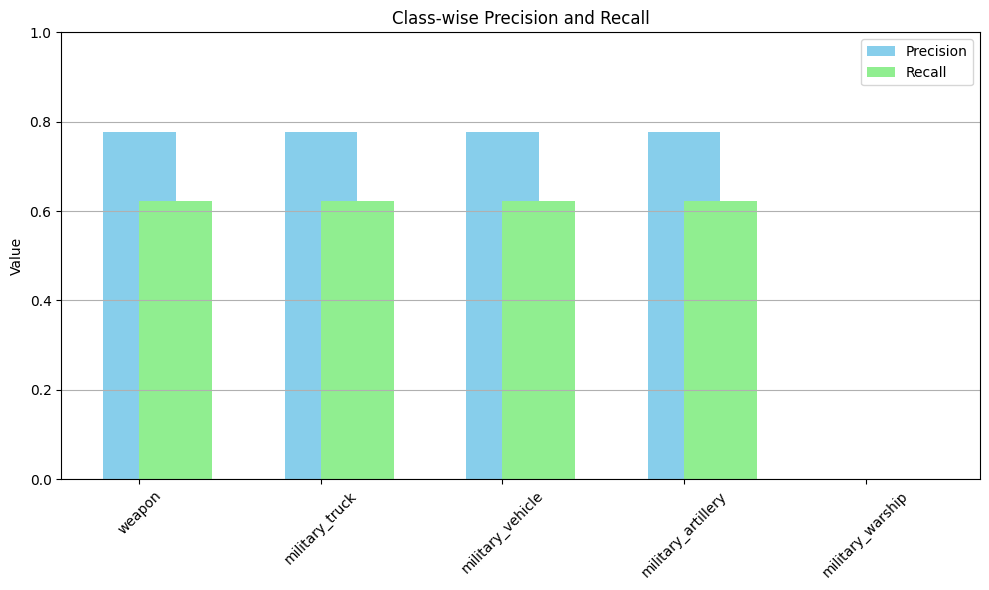

Overall mAP@0.5: 0.712


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Metrics from YOLO training output
classes = ["weapon", "military_truck", "military_vehicle", "military_artillery", "military_warship"]
precision = [0.77593, 0.77593, 0.77593, 0.77593, 0]  # Replace with actual per-class precision if available
recall = [0.62339, 0.62339, 0.62339, 0.62339, 0]     # Replace with actual per-class recall if available
map_50 = 0.71179                                     # Overall mAP@0.5 from training

# Create DataFrame
df = pd.DataFrame({
    "Class": classes,
    "Precision": precision,
    "Recall": recall
})

# Plot bar chart with simple colors
plt.figure(figsize=(10, 6))
x = range(len(classes))
plt.bar(x, df["Precision"], width=0.4, label="Precision", color='skyblue', align='center')
plt.bar(x, df["Recall"], width=0.4, label="Recall", color='lightgreen', align='edge')
plt.xticks(x, classes, rotation=45)
plt.ylim(0, 1)
plt.title("Class-wise Precision and Recall")
plt.ylabel("Value")
plt.grid(axis='y')
plt.legend()
plt.tight_layout()
plt.show()

# Print summary
print("Overall mAP@0.5:", round(map_50, 3))

# Optional: Save as CSV
df.to_csv("/content/drive/MyDrive/Final_Military_project/model_performance_report.csv", index=False)


# **Inference AND Visualization**

In [ ]:
from ultralytics import YOLO

# Load your trained YOLO model from Drive
model = YOLO("/content/drive/MyDrive/Final_Military_project/military_safety_yolov8/weights/best.pt")


In [ ]:
# Predict on test images folder
from ultralytics import YOLO

# Load the trained model
model = YOLO("/content/drive/MyDrive/Final_Military_project/military_safety_yolov8/weights/best.pt")

results = model.predict(
    source="/content/drive/MyDrive/Final_Military_project/military_object_dataset/test/images",
    conf=0.3,   # lower confidence threshold
    save=True,
    save_txt=True,
    project="/content/drive/MyDrive/Final_Military_project/runs/predict",
    name="military_infer",
    exist_ok=True
)




WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/1396 /content/drive/MyDrive/Final_Military_project/military_object_dataset/test/images/000001.jpg: 640x640 (no detections), 7.3ms
image 2/1396 /content/drive/MyDrive/Final_Military_project/military_object_dataset/test/images/000002.jpg: 640x640 (no detections), 10.3ms
image 3/1396 /content/drive/MyDrive/Final_Military_project/military_object_dataset/test/images/000003.jpg: 640x640 (no detections), 7.3ms
image 4/1396 /content/drive/MyDrive/Final

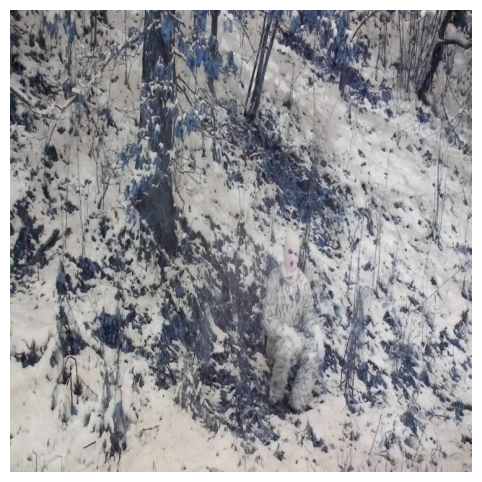

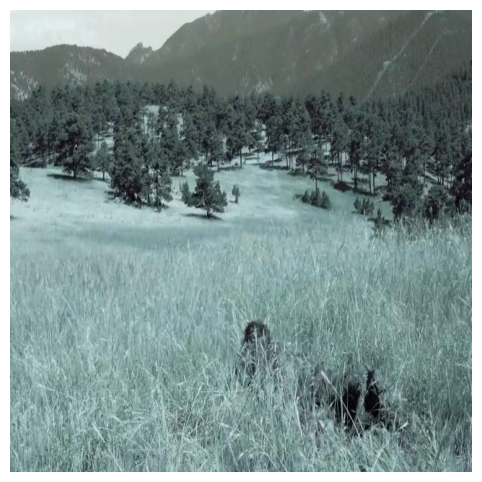

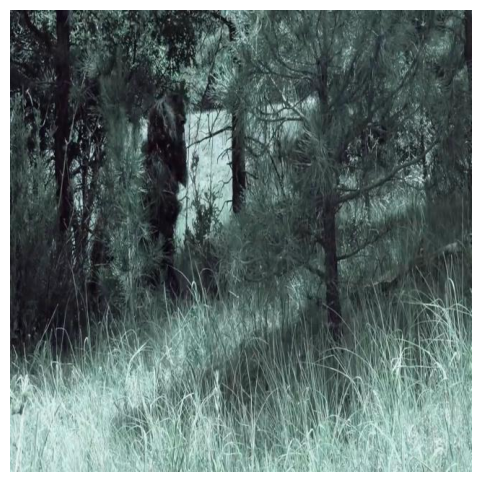

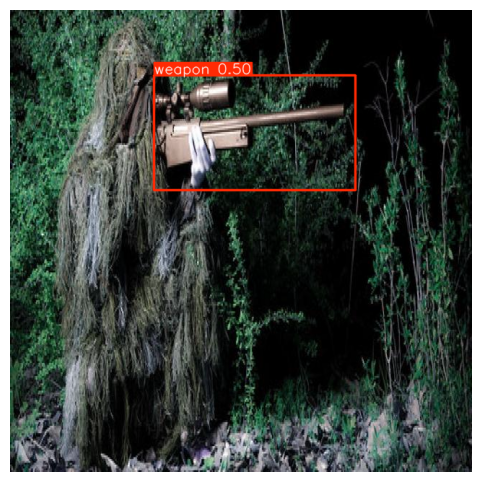

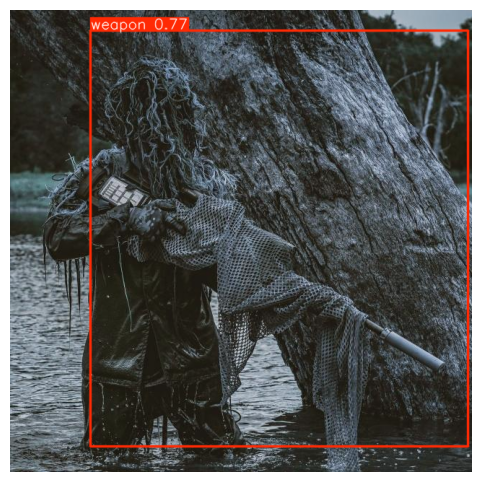

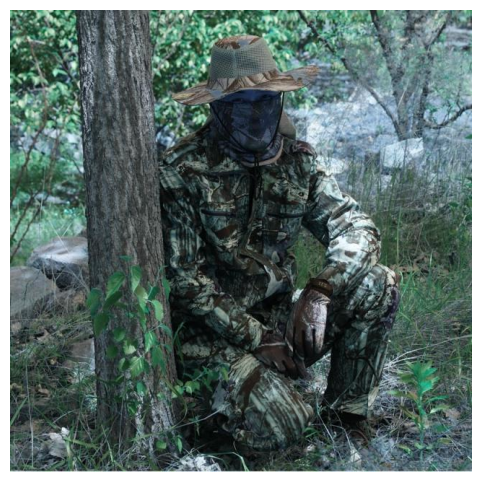

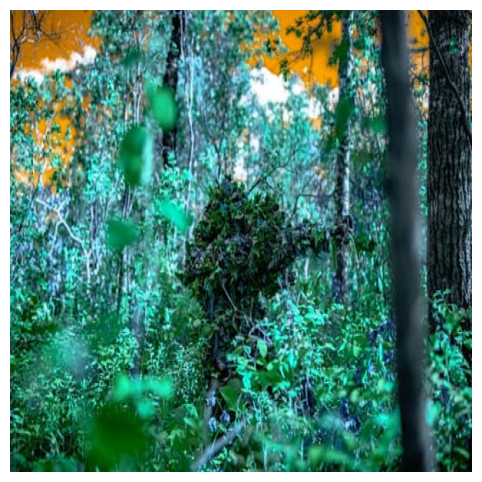

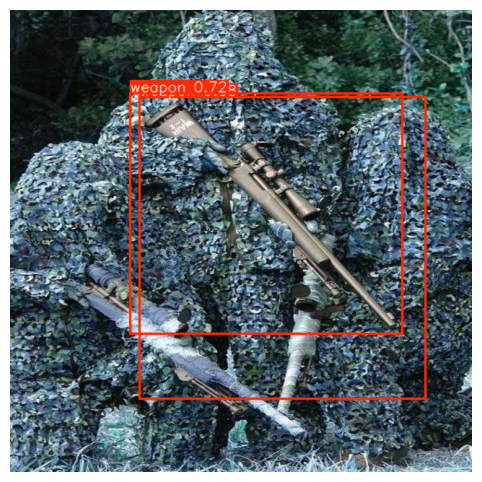

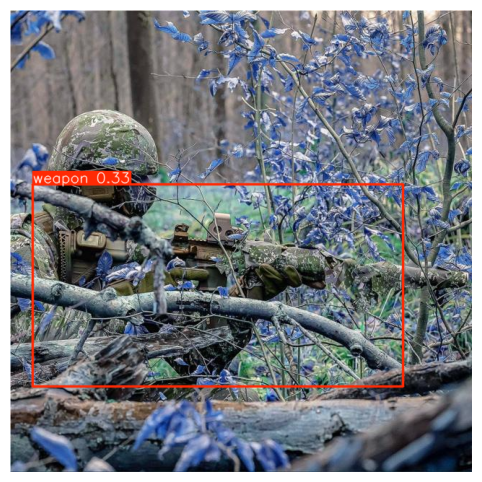

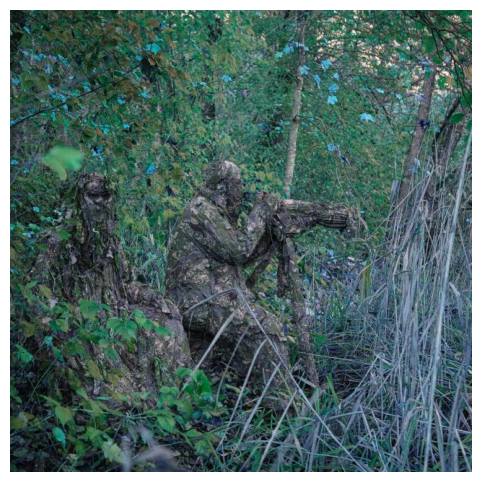

In [ ]:
import matplotlib.pyplot as plt

# Display first 3 images with boxes
for r in results[:10]:
    img_with_boxes = r.plot()  # plots image with bounding boxes and labels
    plt.figure(figsize=(8,6))
    plt.imshow(img_with_boxes)
    plt.axis('off')
    plt.show()


In [ ]:
import os

folder = "/content/drive/MyDrive/Final_Military_project/runs/predict/military_infer"
print("Exists?", os.path.exists(folder))


Exists? True


In [ ]:
!mkdir -p /content/drive/MyDrive/BPT/inference_outputs/


In [ ]:
!cp -r /content/drive/MyDrive/Final_Military_project/runs/predict/military_infer /content/drive/MyDrive/BPT/inference_outputs/


In [ ]:
import os

output_path = "/content/drive/MyDrive/BPT/inference_outputs/military_infer"
print("Files in copied folder:", os.listdir(output_path)[:10])  # shows first 10 files


Files in copied folder: ['labels', '000001.jpg', '000002.jpg', '000003.jpg', '000004.jpg', '000005.jpg', '000006.jpg', '000007.jpg', '000008.jpg', '000009.jpg']


# **Steamlit**




In [ ]:
!pip install streamlit streamlit_option_menu

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 829.3/829.3 kB 10.2 MB/s eta 0:00:00


In [ ]:
!pip install streamlit


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 63.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 128.1 MB/s eta 0:00:00


In [ ]:
%%writefile military_app.py

import streamlit as st
from ultralytics import YOLO
from PIL import Image
import numpy as np

# Streamlit App Configuration

st.set_page_config(page_title="Military Object Detection", layout="centered")
st.title("🪖 Military Object Detection using YOLOv8")
st.markdown("Upload an image to detect military objects using your trained YOLOv8 model.")


# Load Trained YOLOv8 Model

model_path = "/content/drive/MyDrive/Final_Military_project/military_safety_yolov8/weights/best.pt"
model = YOLO(model_path)

# Class names (match your dataset)
class_names = ["weapon", "military_truck", "military_vehicle", "military_artillery", "military_warship"]


# Image Upload Section

uploaded_file = st.file_uploader("📁 Upload Image", type=["jpg", "jpeg", "png"])

if uploaded_file is not None:
    # Read and display the uploaded image
    img = Image.open(uploaded_file).convert("RGB")
    st.image(img, caption="📸 Uploaded Image", use_container_width=True)


    # YOLOv8 Detection

    with st.spinner("🔍 Detecting objects... Please wait."):
        results = model.predict(img, conf=0.3)

        # Get image with bounding boxes
        result_img = results[0].plot()

        # Display result image
        st.image(result_img, caption="✅ Detection Result", use_container_width=True)


        # Display Detected Classes

        st.subheader("🎯 Detected Classes")

        if len(results[0].boxes.data) == 0:
            st.warning("No objects detected in the image.")
        else:
            for i, box in enumerate(results[0].boxes.data):
                cls_id = int(box[-1])          # Class ID
                conf = float(box[-2].item())   # Confidence
                label = class_names[cls_id] if cls_id < len(class_names) else f"Class {cls_id}"
                st.write(f"**{i+1}. {label}** — Confidence: `{conf:.2f}`")

else:
    st.info("👆 Please upload an image (JPG, JPEG, or PNG) to start detection.")


Overwriting military_app.py


In [ ]:
!wget -q -O - ipv4.icanhazip.com   # this command will generate a password for you(copy that)

35.189.180.251


In [ ]:
!streamlit run military_app.py & npx localtunnel --port 8501


⠙

⠹⠸⠼⠴
  You can now view your Streamlit app in your browser.

  Local URL: http://localhost:8501
  Network URL: http://172.28.0.12:8501
  External URL: http://35.189.180.251:8501

⠦⠧⠇⠏⠋your url is: https://crazy-mangos-lick.loca.lt
y
2025-10-24 05:38:23.135 Failed to schedule watch observer for path /content
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/streamlit/watcher/event_based_path_watcher.py", line 186, in watch_path
    folder_handler.watch = self._observer.schedule(
                           ^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/watchdog/observers/api.py", line 312, in schedule
    emitter.start()
  File "/usr/local/lib/python3.12/dist-packages/watchdog/utils/__init__.py", line 75, in start
    self.on_thread_start()
  File "/usr/local/lib/python3.12/dist-packages/watchdog/observers/inotify.py", line 119, in on_thread_start
    self._inotify = InotifyBuffer(path, recursive=self.watch.is_recursive, event